In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pytz
import math
import warnings
from sqlalchemy import *

In [5]:
#To Ignore the warnings
warnings.filterwarnings("ignore")

In [38]:
# ## Create SQLAlchemy engine to create the data base
username = "root"
password = "Pgnkka#"
host = "localhost"
port = 3306
database = "Taxi_ride_fare"
engine = create_engine(f"mysql+pymysql://{username}:{password}@{host}:{port}/{database}")

In [40]:
sel_qry = "SELECT * FROM Taxi_fare"
data = pd.read_sql(sql=sel_qry,con=engine)

In [42]:
#Drop the unwanted columns
col = ['VendorID','tpep_pickup_datetime','tpep_dropoff_datetime','pickup_longitude','pickup_latitude','store_and_fwd_flag',
       'dropoff_longitude','dropoff_latitude','payment_type','Dropoff_date']
data.drop(col,axis=1,inplace=True)

In [44]:
#Set the index as Pick up date
data.set_index('Pickup_date',inplace=True)

In [46]:
data.head()

,passenger_count,RatecodeID,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_distance,day_of_week,AM/PM,Trip_duration_minutes,Pickup_time
Pickup_date,,,,,,,,,,,,,,
2016-02-29 19:00:00,1,1,9.0,0.5,0.5,2.05,0.0,0.3,12.35,3.138096,1,PM,7.55,19
2016-02-29 19:00:00,1,1,11.0,0.5,0.5,3.05,0.0,0.3,15.35,4.303331,1,PM,11.06,19
2016-02-29 19:00:00,2,1,54.5,0.5,0.5,8.00,0.0,0.3,63.80,16.600142,1,PM,31.06,19
2016-02-29 19:00:01,1,1,20.5,0.5,0.5,0.00,0.0,0.3,21.80,7.950066,1,PM,16.03,19
2016-02-29 19:00:01,1,1,5.5,0.5,0.5,2.00,0.0,0.3,8.80,0.837395,1,PM,4.59,19


In [48]:
#Use label encoding 
import pandas as pd
from sklearn.preprocessing import LabelEncoder
label_en = LabelEncoder()

# 3. Fit and transform the data
# The encoder learns the unique categories and assigns numerical values
data['AM/PM'] = label_en.fit_transform(data['AM/PM'])

#data["AM/PM"] = data.groupby("AM/PM")["total_amount"].transform("mean")

### Outlier and Skewness treatment

Text(0, 0.5, 'Trip duration minutes')

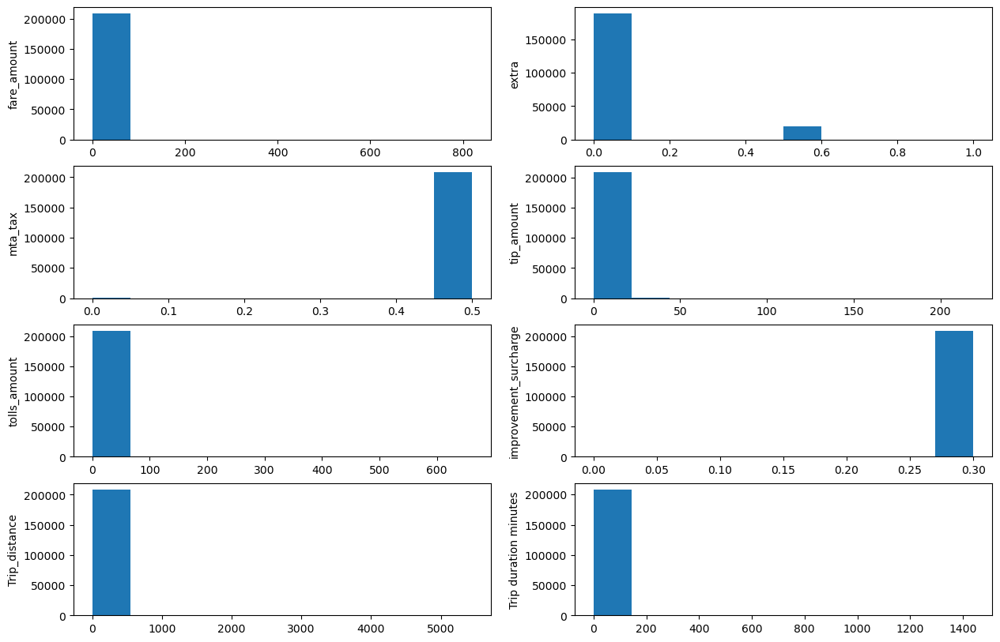

In [51]:
#Distribution of the data before treating outlier
plt.figure(figsize=(15, 10))


plt.subplot(4, 2, 1)
plt.hist(data['fare_amount'])
plt.ylabel('fare_amount')

plt.subplot(4, 2, 2)
plt.hist(data['extra'])
plt.ylabel('extra')

plt.subplot(4, 2, 3)
plt.hist(data['mta_tax'])
plt.ylabel('mta_tax')

plt.subplot(4, 2, 4)
plt.hist(data['tip_amount'])
plt.ylabel('tip_amount')

plt.subplot(4, 2, 5)
plt.hist(data['tolls_amount'])
plt.ylabel('tolls_amount')

plt.subplot(4, 2, 6)
plt.hist(data['improvement_surcharge'])
plt.ylabel('improvement_surcharge')

plt.subplot(4, 2, 7)
plt.hist(data['trip_distance'])
plt.ylabel('Trip_distance')

plt.subplot(4, 2, 8)
plt.hist(data['Trip_duration_minutes'])
plt.ylabel('Trip duration minutes')


Text(0, 0.5, 'Trip_duration_minutes')

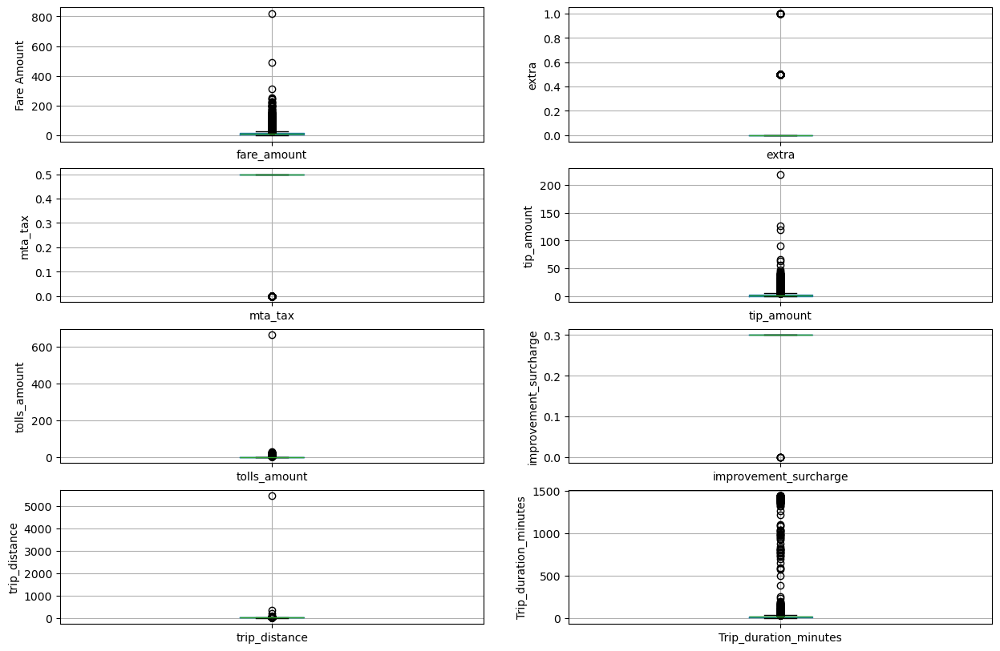

In [53]:
#To check outliers
plt.figure(figsize=(15, 10))


plt.subplot(4, 2, 1)
fig = data.boxplot(column='fare_amount')
fig.set_ylabel('Fare Amount')

plt.subplot(4, 2, 2)
fig = data.boxplot(column='extra')
fig.set_ylabel('extra')

plt.subplot(4, 2, 3)
fig = data.boxplot(column='mta_tax')
fig.set_ylabel('mta_tax')

plt.subplot(4, 2, 4)
fig = data.boxplot(column='tip_amount')
fig.set_ylabel('tip_amount')

plt.subplot(4, 2, 5)
fig = data.boxplot(column='tolls_amount')
fig.set_ylabel('tolls_amount')

plt.subplot(4, 2, 6)
fig = data.boxplot(column='improvement_surcharge')
fig.set_ylabel('improvement_surcharge')

plt.subplot(4, 2, 7)
fig = data.boxplot(column='trip_distance')
fig.set_ylabel('trip_distance')

plt.subplot(4, 2, 8)
fig = data.boxplot(column='Trip_duration_minutes')
fig.set_ylabel('Trip_duration_minutes')


In [54]:
def outlier_iqr(data,col):
    for feature in col:
        if feature=='Mean_Estimate':
            pass
        else:            
            IQR = data[feature].quantile(0.75) - data[feature].quantile(0.25)
            lower = data[feature].quantile(0.25) - IQR*1.5
            upper = data[feature].quantile(0.75) + IQR*1.5
            data[feature]=data[feature].clip(lower=lower, upper=upper)
            print("Outlier Treatment done for : ",feature)
    return data

num_col = ['passenger_count', 'RatecodeID', 'fare_amount', 'extra', 'mta_tax',
       'tip_amount', 'tolls_amount', 'improvement_surcharge',
       'trip_distance', 'week_day', 'AM/PM', 'Trip_duration_minutes','Pickup_time']

In [58]:
num_col = ['fare_amount', 'extra', 'mta_tax',
       'tip_amount', 'tolls_amount', 'improvement_surcharge',
       'trip_distance', 'Trip_duration_minutes']

In [60]:
data = outlier_iqr(data,num_col)

Outlier Treatment done for :  fare_amount
Outlier Treatment done for :  extra
Outlier Treatment done for :  mta_tax
Outlier Treatment done for :  tip_amount
Outlier Treatment done for :  tolls_amount
Outlier Treatment done for :  improvement_surcharge
Outlier Treatment done for :  trip_distance
Outlier Treatment done for :  Trip_duration_minutes


Text(0, 0.5, 'Trip duration minutes')

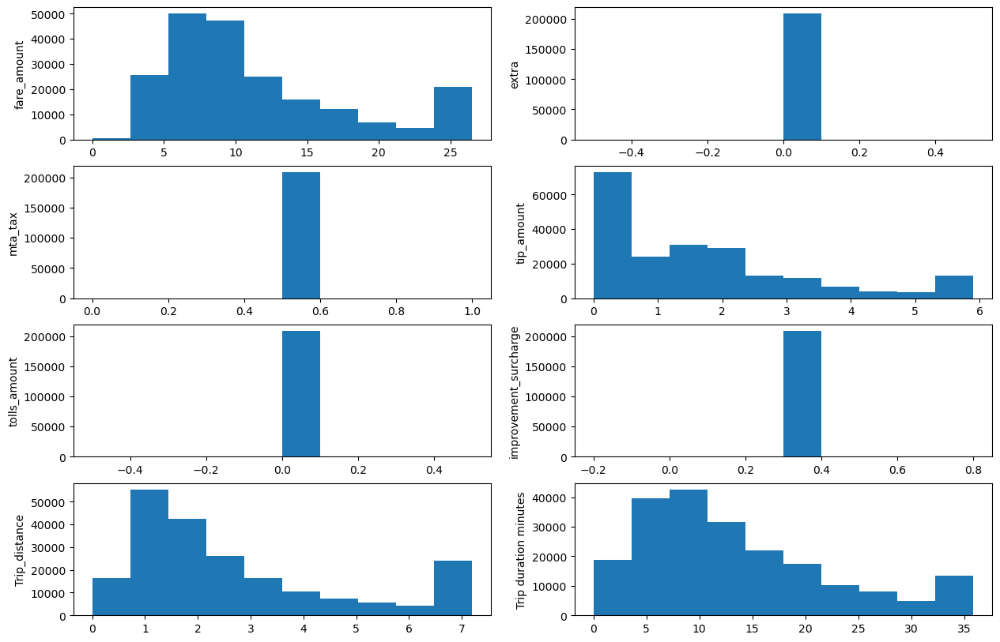

In [62]:
#Distribution of data after treating outlier
plt.figure(figsize=(15, 10))

plt.subplot(4, 2, 1)
plt.hist(data['fare_amount'])
plt.ylabel('fare_amount')

plt.subplot(4, 2, 2)
plt.hist(data['extra'])
plt.ylabel('extra')

plt.subplot(4, 2, 3)
plt.hist(data['mta_tax'])
plt.ylabel('mta_tax')

plt.subplot(4, 2, 4)
plt.hist(data['tip_amount'])
plt.ylabel('tip_amount')

plt.subplot(4, 2, 5)
plt.hist(data['tolls_amount'])
plt.ylabel('tolls_amount')

plt.subplot(4, 2, 6)
plt.hist(data['improvement_surcharge'])
plt.ylabel('improvement_surcharge')

plt.subplot(4, 2, 7)
plt.hist(data['trip_distance'])
plt.ylabel('Trip_distance')

plt.subplot(4, 2, 8)
plt.hist(data['Trip_duration_minutes'])
plt.ylabel('Trip duration minutes')


Text(0, 0.5, 'Trip_duration_minutes')

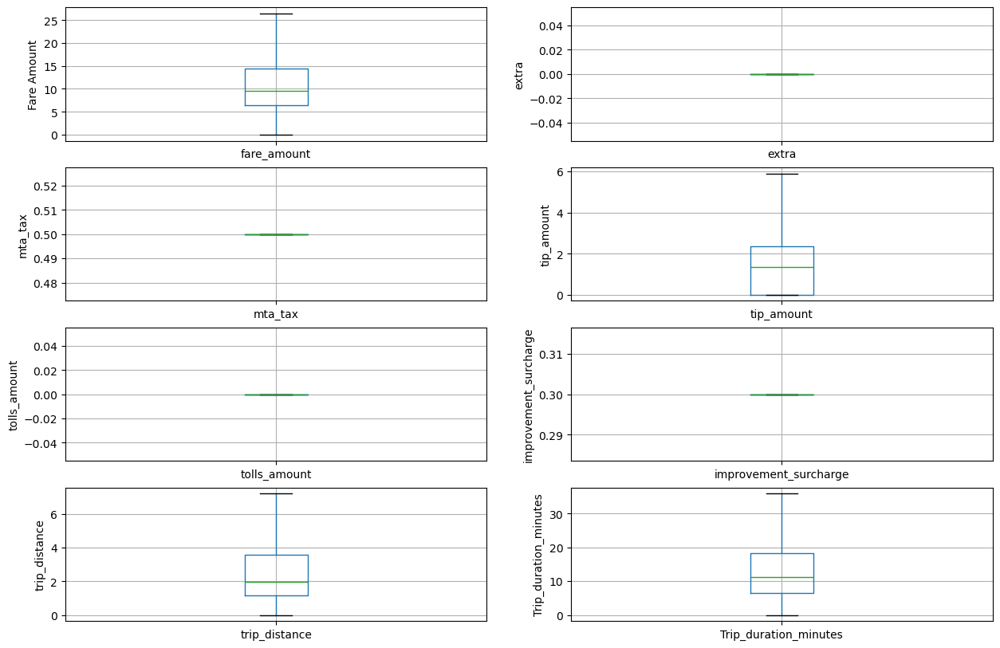

In [64]:
#To check outliers after treatment

plt.figure(figsize=(15, 10))

plt.subplot(4, 2, 1)
fig = data.boxplot(column='fare_amount')
fig.set_ylabel('Fare Amount')

plt.subplot(4, 2, 2)
fig = data.boxplot(column='extra')
fig.set_ylabel('extra')

plt.subplot(4, 2, 3)
fig = data.boxplot(column='mta_tax')
fig.set_ylabel('mta_tax')

plt.subplot(4, 2, 4)
fig = data.boxplot(column='tip_amount')
fig.set_ylabel('tip_amount')

plt.subplot(4, 2, 5)
fig = data.boxplot(column='tolls_amount')
fig.set_ylabel('tolls_amount')

plt.subplot(4, 2, 6)
fig = data.boxplot(column='improvement_surcharge')
fig.set_ylabel('improvement_surcharge')

plt.subplot(4, 2, 7)
fig = data.boxplot(column='trip_distance')
fig.set_ylabel('trip_distance')

plt.subplot(4, 2, 8)
fig = data.boxplot(column='Trip_duration_minutes')
fig.set_ylabel('Trip_duration_minutes')


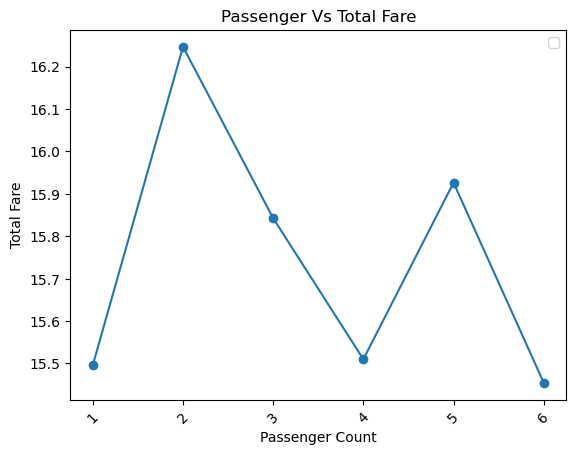

In [66]:
fig,ax = plt.subplots()
ax.plot(data.groupby("passenger_count")['total_amount'].mean(),marker="o")
ax.set_xlabel("Passenger Count")
#ax.set_xticks(data['trip_distance'].value_counts().sort_index().index)
ax.tick_params("x", rotation=45)
ax.set_ylabel("Total Fare")
ax.set_title("Passenger Vs Total Fare")
ax.legend()

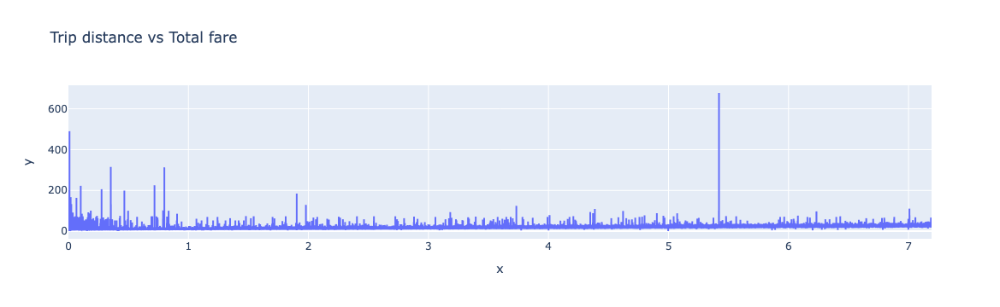

In [68]:
import plotly.express as px
fig = px.line(x=data.groupby("trip_distance")['total_amount'].mean().index, 
              y=data.groupby("trip_distance")['total_amount'].mean().values, title="Trip distance vs Total fare")
fig.show()

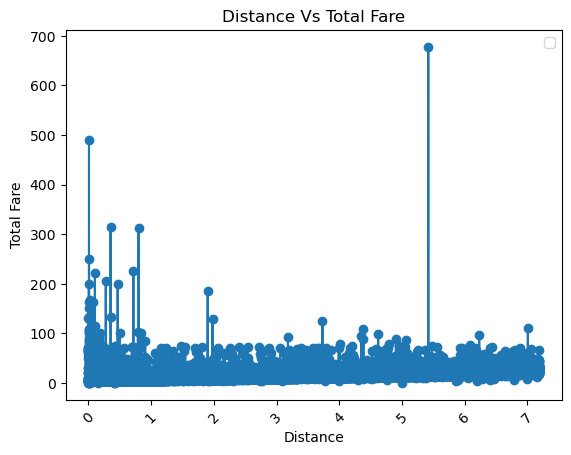

In [70]:
fig,ax = plt.subplots()
ax.plot(data.groupby("trip_distance")['total_amount'].mean(),marker="o")
ax.set_xlabel("Distance")
#ax.set_xticks(data['trip_distance'].value_counts().sort_index().index)
ax.tick_params("x", rotation=45)
ax.set_ylabel("Total Fare")
ax.set_title("Distance Vs Total Fare")
ax.legend()

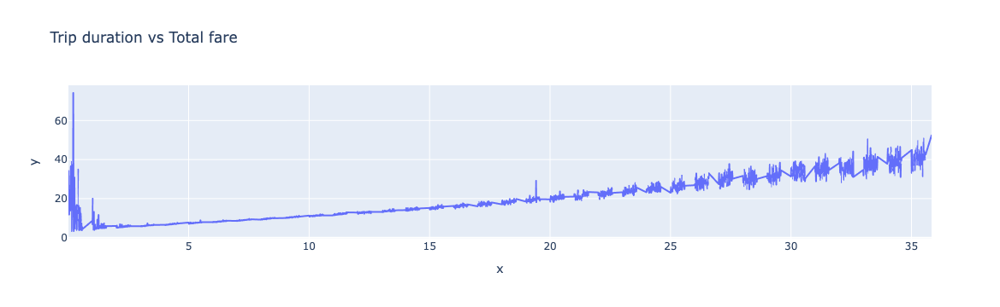

In [72]:
import plotly.express as px

fig = px.line(x=data.groupby("Trip_duration_minutes")['total_amount'].mean().index, 
              y=data.groupby("Trip_duration_minutes")['total_amount'].mean().values, title="Trip duration vs Total fare")
fig.show()

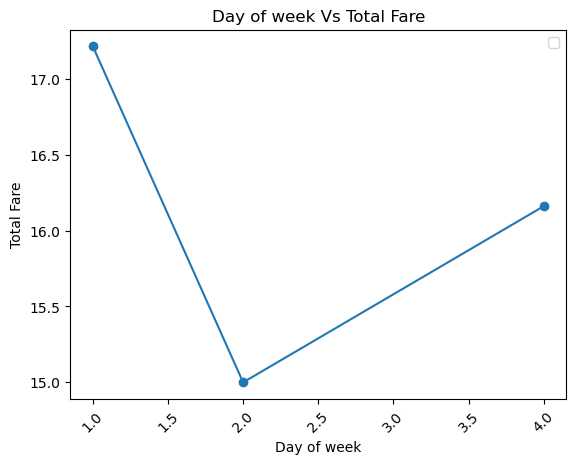

In [74]:
fig,ax = plt.subplots()
ax.plot(data.groupby("day_of_week")['total_amount'].mean(),marker="o")
ax.set_xlabel("Day of week")
ax.tick_params("x", rotation=45)
ax.set_ylabel("Total Fare")
ax.set_title("Day of week Vs Total Fare")
ax.legend()

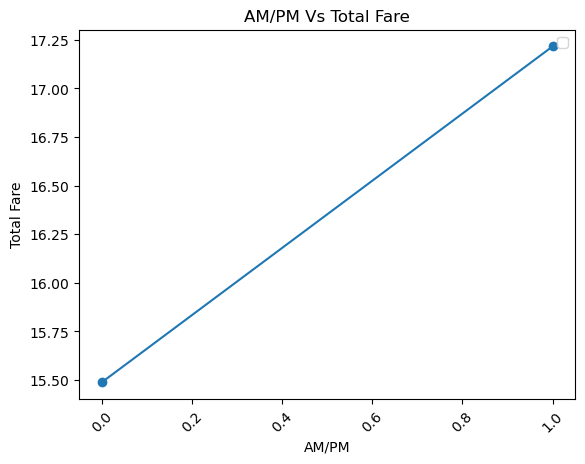

In [76]:
fig,ax = plt.subplots()
ax.plot(data.groupby("AM/PM")['total_amount'].mean(),marker="o")
ax.set_xlabel("AM/PM")
ax.tick_params("x", rotation=45)
ax.set_ylabel("Total Fare")
ax.set_title("AM/PM Vs Total Fare")
ax.legend()

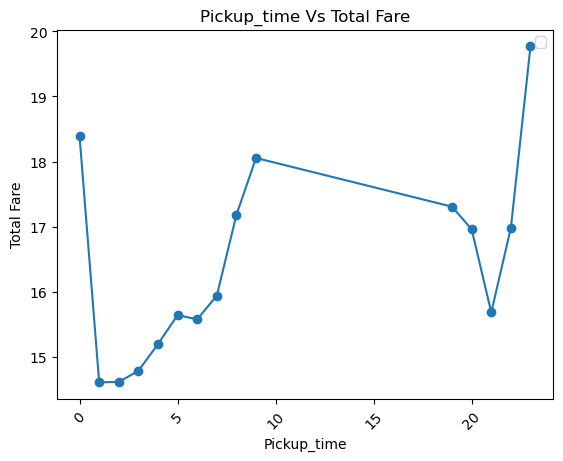

In [78]:
fig,ax = plt.subplots()
ax.plot(data.groupby("Pickup_time")['total_amount'].mean(),marker="o")
ax.set_xlabel("Pickup_time")
ax.tick_params("x", rotation=45)
ax.set_ylabel("Total Fare")
ax.set_title("Pickup_time Vs Total Fare")
ax.legend()

In [80]:
data[num_col].skew()

fare_amount              1.078570
extra                    0.000000
mta_tax                  0.000000
tip_amount               1.065832
tolls_amount             0.000000
improvement_surcharge    0.000000
trip_distance            1.096810
Trip_duration_minutes    0.977219
dtype: float64

In [82]:
skew_col=[]
for i in data[num_col].skew().index:
    if data[num_col].skew()[i] > 0.5 or data[num_col].skew()[i] < -0.5:
        if i == 'total_amount':
            pass
        else:
            skew_col.append(i) 

In [84]:
skew_col

['fare_amount', 'tip_amount', 'trip_distance', 'Trip_duration_minutes']

In [86]:
from sklearn.preprocessing import PowerTransformer
yeojohnTr = PowerTransformer(standardize=True)   # not using method attribute as yeo-johnson is the default
for feature in skew_col:
    data[feature] = yeojohnTr.fit_transform(data[feature].values.reshape(-1,1))

In [88]:
data[num_col].skew()

fare_amount              0.029312
extra                    0.000000
mta_tax                  0.000000
tip_amount               0.027454
tolls_amount             0.000000
improvement_surcharge    0.000000
trip_distance            0.055010
Trip_duration_minutes   -0.019030
dtype: float64

Text(0, 0.5, 'Trip_duration_minutes')

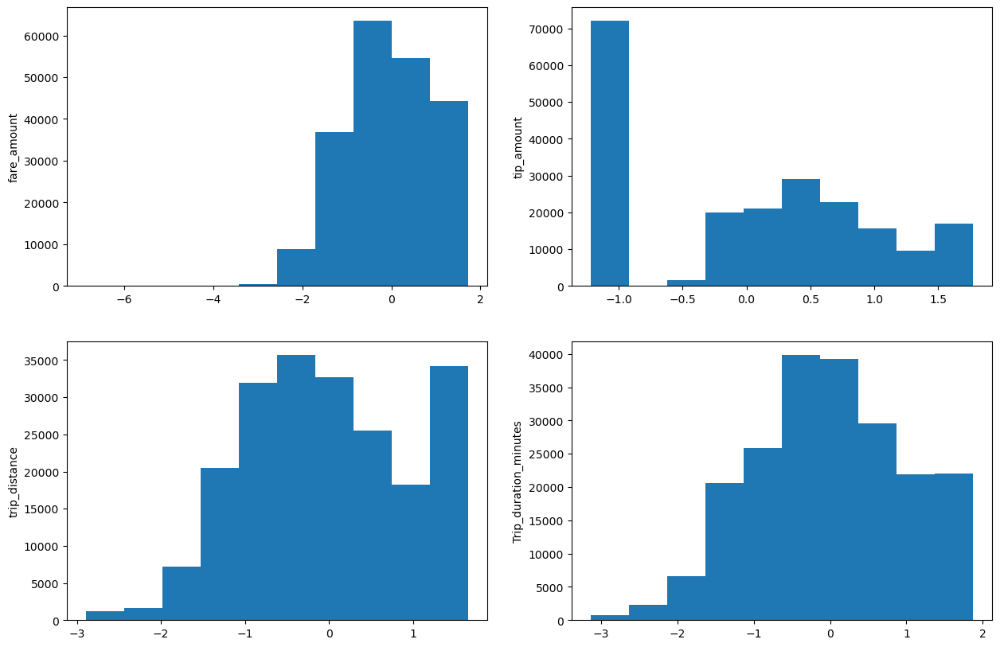

In [90]:
#To check the distribution after treating skewness
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.hist(data['fare_amount'])
plt.ylabel('fare_amount')

plt.subplot(2, 2, 2)
plt.hist(data['tip_amount'])
plt.ylabel('tip_amount')

plt.subplot(2, 2, 3)
plt.hist(data['trip_distance'])
plt.ylabel('trip_distance')

plt.subplot(2, 2, 4)
plt.hist(data['Trip_duration_minutes'])
plt.ylabel('Trip_duration_minutes')


In [92]:
data[num_col].skew()

fare_amount              0.029312
extra                    0.000000
mta_tax                  0.000000
tip_amount               0.027454
tolls_amount             0.000000
improvement_surcharge    0.000000
trip_distance            0.055010
Trip_duration_minutes   -0.019030
dtype: float64

In [94]:
#How fare and distance is assoicated

In [97]:
#How Fare and passenger count is associated

In [99]:
#Fare Variations across different times of the day

In [101]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,root_mean_squared_error,r2_score
from sklearn.preprocessing import MinMaxScaler

col_sel = ['passenger_count', 'RatecodeID', 'fare_amount', 'extra', 'mta_tax',
       'tip_amount', 'tolls_amount', 'improvement_surcharge',
       'trip_distance', 'day_of_week', 'AM/PM', 'Trip_duration_minutes','Pickup_time']
X = data[col_sel]
y = data['total_amount']

# 2. Split Data (80% Train, 20% Test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 3. Initialize and Train Random Forest
# n_estimators=100 means we are building 100 trees
rf_model = RandomForestRegressor(n_estimators=100, 
                                  random_state=42, 
                                  max_depth=5)
rf_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=5, random_state=42)

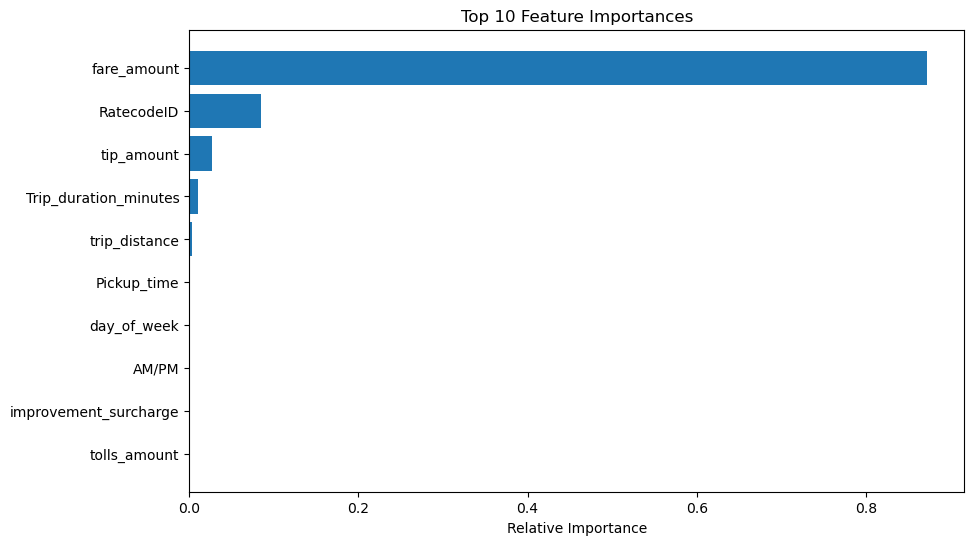

In [103]:
# Random Forest allows us to see which features contributed most to the decision
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1] # Sort descending
# Take top 7 features for readability
top_n = 10
top_features = [X.columns[i] for i in indices[:top_n]]
top_importances = importances[indices[:top_n]]

plt.figure(figsize=(10, 6))
plt.title(f"Top {top_n} Feature Importances")
plt.barh(range(top_n), top_importances, align="center")
plt.yticks(range(top_n), top_features)
plt.xlabel("Relative Importance")
plt.gca().invert_yaxis() # Highest importance on top
plt.show()

In [74]:
### MODEL BUILDING

In [105]:
top_features[:7]

['fare_amount',
 'RatecodeID',
 'tip_amount',
 'Trip_duration_minutes',
 'trip_distance',
 'Pickup_time',
 'day_of_week']

In [107]:

X = data[top_features[:7]]
y = data['total_amount']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [109]:
# LINEAR REGRESSION

In [111]:
from sklearn.linear_model import LinearRegression
model_MLR = LinearRegression() 
model_MLR.fit(X_train, y_train)
y_pred_mlr = model_MLR.predict(X_test)
mae_mlr = mean_absolute_error(y_test,y_pred_mlr)
mse_mlr = mean_squared_error(y_test,y_pred_mlr)
rmse_mlr = root_mean_squared_error(y_test,y_pred_mlr)
r2_mlr = r2_score(y_test,y_pred_mlr)

In [113]:
print("*******************************")
print("Evaluation Metrics For MLR")
print("Mean Absolute Error ",mae_mlr)
print("Mean Squared Error ",mse_mlr)
print("Root Mean Squared Error ",rmse_mlr)
print("R2 Score ",r2_mlr)

*******************************
Evaluation Metrics For MLR
Mean Absolute Error  4.341360345296938
Mean Squared Error  46.25471256137977
Root Mean Squared Error  6.801081719945715
R2 Score  0.7273685539669175


In [115]:
# ELASTIC NET

In [117]:
from sklearn.linear_model import ElasticNet
# Initialize and fit the Elastic Net model 
elastic_net = ElasticNet(alpha=1.0, l1_ratio=0.5) 
elastic_net.fit(X_train, y_train) 

# Make predictions 
y_pred_elas = elastic_net.predict(X_test) 
mae_elas = mean_absolute_error(y_test,y_pred_elas)
mse_elas = mean_squared_error(y_test,y_pred_elas)
rmse_elas = root_mean_squared_error(y_test,y_pred_elas)
r2_elas = r2_score(y_test,y_pred_elas)

print("*******************************")
print("Evaluation Metrics For Elastic Net")
print("Mean Absolute Error ",mae_elas)
print("Mean Squared Error ",mse_elas)
print("Root Mean Squared Error ",rmse_elas)
print("R2 Score ",r2_elas)

*******************************
Evaluation Metrics For Elastic Net
Mean Absolute Error  4.399450226159461
Mean Squared Error  67.11336387426967
Root Mean Squared Error  8.192274645925249
R2 Score  0.6044248806668882


In [119]:
# DECISION TREE

In [121]:
from sklearn.tree import DecisionTreeRegressor

model_dt = DecisionTreeRegressor(max_depth=10)
model_dt.fit(X_train, y_train) 
# Make predictions 
y_pred_dt = model_dt.predict(X_test) 
mae_dt = mean_absolute_error(y_test,y_pred_dt)
mse_dt = mean_squared_error(y_test,y_pred_dt)
rmse_dt = root_mean_squared_error(y_test,y_pred_dt)
r2_dt = r2_score(y_test,y_pred_dt)

print("*******************************")
print("Evaluation Metrics For Decision Tree")
print("Mean Absolute Error ",mae_dt)
print("Mean Squared Error ",mse_dt)
print("Root Mean Squared Error ",rmse_dt)
print("R2 Score ",r2_dt)

*******************************
Evaluation Metrics For Decision Tree
Mean Absolute Error  0.5692740041351171
Mean Squared Error  14.25646982070308
Root Mean Squared Error  3.775774069075516
R2 Score  0.9159704651199039


In [123]:
# RANDOM FOREST

In [125]:
model_rf = RandomForestRegressor(n_estimators=100, 
                                  random_state=42, 
                                  max_depth=15,oob_score=True)
model_rf.fit(X_train, y_train)

y_pred_rf = model_rf.predict(X_test) 
mae_rf = mean_absolute_error(y_test,y_pred_rf)
mse_rf = mean_squared_error(y_test,y_pred_rf)
rmse_rf = root_mean_squared_error(y_test,y_pred_rf)
r2_rf = r2_score(y_test,y_pred_rf)

print("*******************************")
print("Evaluation Metrics For Random Forest")
print("Mean Absolute Error ",mae_rf)
print("Mean Squared Error ",mse_rf)
print("Root Mean Squared Error ",rmse_rf)
print("R2 Score ",r2_rf)
print("OOB Score ",model_rf.oob_score_)

*******************************
Evaluation Metrics For Random Forest
Mean Absolute Error  0.4918942220630384
Mean Squared Error  8.534779782542532
Root Mean Squared Error  2.9214345418890586
R2 Score  0.9496948694557171
OOB Score  0.900534593362093


In [127]:
#Gradient Boosting

In [129]:
from sklearn.ensemble import GradientBoostingRegressor
model_gradient = GradientBoostingRegressor(loss='absolute_error',
                                learning_rate=0.1,
                                n_estimators=300,
                                max_depth = 1, 
                                random_state = 42,
                                max_features = 5)

model_gradient.fit(X_train, y_train)

y_pred_gr = model_gradient.predict(X_test)
mae_gr = mean_absolute_error(y_test,y_pred_gr)
mse_gr = mean_squared_error(y_test,y_pred_gr)
rmse_gr = root_mean_squared_error(y_test,y_pred_gr)
r2_gr = r2_score(y_test,y_pred_gr)

print("*******************************")
print("Evaluation Metrics For Gradient Boosting ")
print("Mean Absolute Error ",mae_gr)
print("Mean Squared Error ",mse_gr)
print("Root Mean Squared Error ",rmse_gr)
print("R2 Score ",r2_gr)

*******************************
Evaluation Metrics For Gradient Boosting 
Mean Absolute Error  0.9741346206550756
Mean Squared Error  13.259003650904623
Root Mean Squared Error  3.641291481178707
R2 Score  0.9218496637827508


In [131]:
#Cross Validation
from sklearn.model_selection import cross_val_score

scores = cross_val_score(model_rf, X_train, y_train, cv=5, scoring='r2')
print(f'Cross Val scores - {scores}')

Cross Val scores - [0.85564761 0.95503095 0.94223598 0.92239541 0.83844639]


In [133]:
#Hyper Parameter Tuning

In [135]:
#Define the Parameter Grid
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [25, 50, 100, 200],         # Forest sizes
    'max_depth': [None, 10, 20, 30],        # Unlimited depth(None) vs restricted depth
    'min_samples_split': [2, 5, 10, 20],        # Splitting strictness
    'max_features': ['sqrt', 'log2']            # Feature selection limits
}

# 4. Initialize Grid Search
# cv=5 means "5-Fold Cross-Validation" (train/test split happens 5 times internally for every combo)
grid_search = GridSearchCV(estimator=model_rf, param_grid=param_grid, 
                           cv=3, n_jobs=1, verbose=3, scoring='r2')

# 5. Fit the Search (This may take a minute as it fits many models!)
print("Starting Grid Search...")
grid_search.fit(X_train, y_train)

# 6. View Results
print("\n--- Best Parameters Found ---")
print(grid_search.best_params_)

print(f"\n--- Best Cross-Validation Accuracy: {grid_search.best_score_ * 100:.2f}% ---")

# 7. Evaluate the Optimized Model on the held-out Test Set
best_rf = grid_search.best_estimator_
test_accuracy = best_rf.score(X_test, y_test)
print(f"Test Set Accuracy: {test_accuracy * 100:.2f}%")

Starting Grid Search...
Fitting 3 folds for each of 128 candidates, totalling 384 fits
[CV 1/3] END max_depth=None, max_features=sqrt, min_samples_split=2, n_estimators=25;, score=0.894 total time=   2.6s
[CV 2/3] END max_depth=None, max_features=sqrt, min_samples_split=2, n_estimators=25;, score=0.934 total time=   2.5s
[CV 3/3] END max_depth=None, max_features=sqrt, min_samples_split=2, n_estimators=25;, score=0.874 total time=   2.5s
[CV 1/3] END max_depth=None, max_features=sqrt, min_samples_split=2, n_estimators=50;, score=0.895 total time=   4.9s
[CV 2/3] END max_depth=None, max_features=sqrt, min_samples_split=2, n_estimators=50;, score=0.936 total time=   5.0s
[CV 3/3] END max_depth=None, max_features=sqrt, min_samples_split=2, n_estimators=50;, score=0.874 total time=   5.0s
[CV 1/3] END max_depth=None, max_features=sqrt, min_samples_split=2, n_estimators=100;, score=0.895 total time=  10.0s
[CV 2/3] END max_depth=None, max_features=sqrt, min_samples_split=2, n_estimators=100;

In [137]:
grid_search.best_params_

{'max_depth': 30,
 'max_features': 'sqrt',
 'min_samples_split': 20,
 'n_estimators': 200}

In [139]:
#Impute the best parameters in the RF model
model_rf_best = RandomForestRegressor(n_estimators=grid_search.best_params_['n_estimators'], 
                                      random_state=42, 
                                      max_depth=grid_search.best_params_['max_depth'],
                                     max_features=grid_search.best_params_['max_features'],
                                     min_samples_split=grid_search.best_params_['min_samples_split'],
                                     oob_score=True)
model_rf_best.fit(X_train, y_train)

y_pred_rf_best = model_rf_best.predict(X_test) 
mae_rf_best = mean_absolute_error(y_test,y_pred_rf_best)
mse_rf_best = mean_squared_error(y_test,y_pred_rf_best)
rmse_rf_best = root_mean_squared_error(y_test,y_pred_rf_best)
r2_rf_best = r2_score(y_test,y_pred_rf_best)

print("*******************************")
print("Evaluation Metrics For Random Forest")
print("Mean Absolute Error ",mae_rf_best)
print("Mean Squared Error ",mse_rf_best)
print("Root Mean Squared Error ",rmse_rf_best)
print("R2 Score ",r2_rf_best)
print("OOB_Score ",model_rf_best.oob_score_)

*******************************
Evaluation Metrics For Random Forest
Mean Absolute Error  0.5354317334025339
Mean Squared Error  7.019169332574658
Root Mean Squared Error  2.649371497652728
R2 Score  0.958628079624287
OOB_Score  0.9112367906887638


In [141]:
#Save the best model
import joblib
joblib.dump(model_rf_best, 'taxi_ride_fare.pkl')

['taxi_ride_fare.pkl']

In [151]:
data.head()

,passenger_count,RatecodeID,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_distance,day_of_week,AM/PM,Trip_duration_minutes,Pickup_time
Pickup_date,,,,,,,,,,,,,,
2016-02-29 19:00:00,1,1,-0.129146,0.0,0.5,0.581182,0.0,0.3,12.35,0.569221,1,1,-0.545214,19
2016-02-29 19:00:00,1,1,0.244390,0.0,0.5,1.006495,0.0,0.3,15.35,0.998803,1,1,-0.029767,19
2016-02-29 19:00:00,2,1,1.726830,0.0,0.5,1.772607,0.0,0.3,63.80,1.657095,1,1,1.616790,19
2016-02-29 19:00:01,1,1,1.321369,0.0,0.5,-1.217878,0.0,0.3,21.80,1.657095,1,1,0.519497,19
2016-02-29 19:00:01,1,1,-1.089402,0.0,0.5,0.556004,0.0,0.3,8.80,-1.171101,1,1,-1.140636,19
